In [1]:
import tifffile as tf
import matplotlib.pylab as plt
import numpy as np
import sys
from scipy import ndimage
from scipy.ndimage import measurements

sys.path = ["./matchedmyo/","./"] + sys.path
import util

from skimage import transform
import cv2
import matplotlib.pylab as plt
import mach_functions
import mach_util as mu
import imutils

pygame 1.9.6
Hello from the pygame community. https://www.pygame.org/contribute.html


In [2]:
# read in the test image 
root = "./TestImages/diff_rod_directions/"

rod_filter = "rod_filter.txt" 
testImage = "rod.png"
trueImage = "rod_true.png"

# read in these files

rod_filter = np.loadtxt(root+rod_filter)

testImage = cv2.imread(root+testImage) # by default, cv2 reads in bgr order
testImage = cv2.cvtColor(testImage, cv2.COLOR_BGR2RGB)

trueImage = cv2.imread(root+trueImage)
trueImage = cv2.cvtColor(trueImage,cv2.COLOR_BGR2RGB)


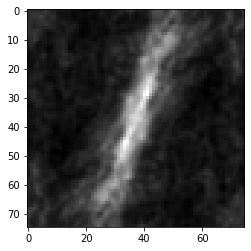

In [3]:
plt.imshow(rod_filter,cmap='gray')

Text(0.5, 1.0, 'Annotated image that \n will serve as the truth image')

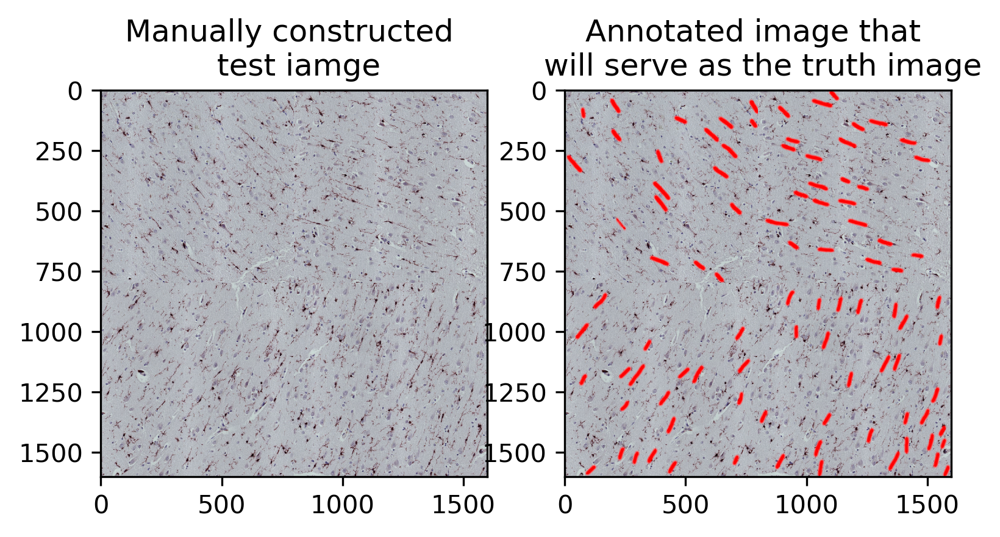

In [4]:
plt.figure(dpi=300)
plt.subplot(1,2,1)
plt.title("Manually constructed \n test iamge")
plt.imshow(testImage)
plt.subplot(1,2,2)
plt.imshow(trueImage)
plt.title("Annotated image that \n will serve as the truth image")

In [5]:
markimage = mach_functions.getTrueMarkedCells(trueImage,markechannel='red')

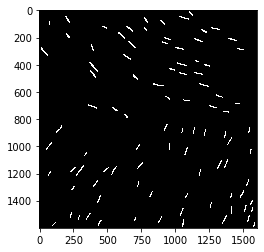

In [6]:
plt.imshow(markimage,cmap='gray')

In [7]:
#preprocess test image
testImage = mach_functions.PreProcessCroppedCells(testImage)

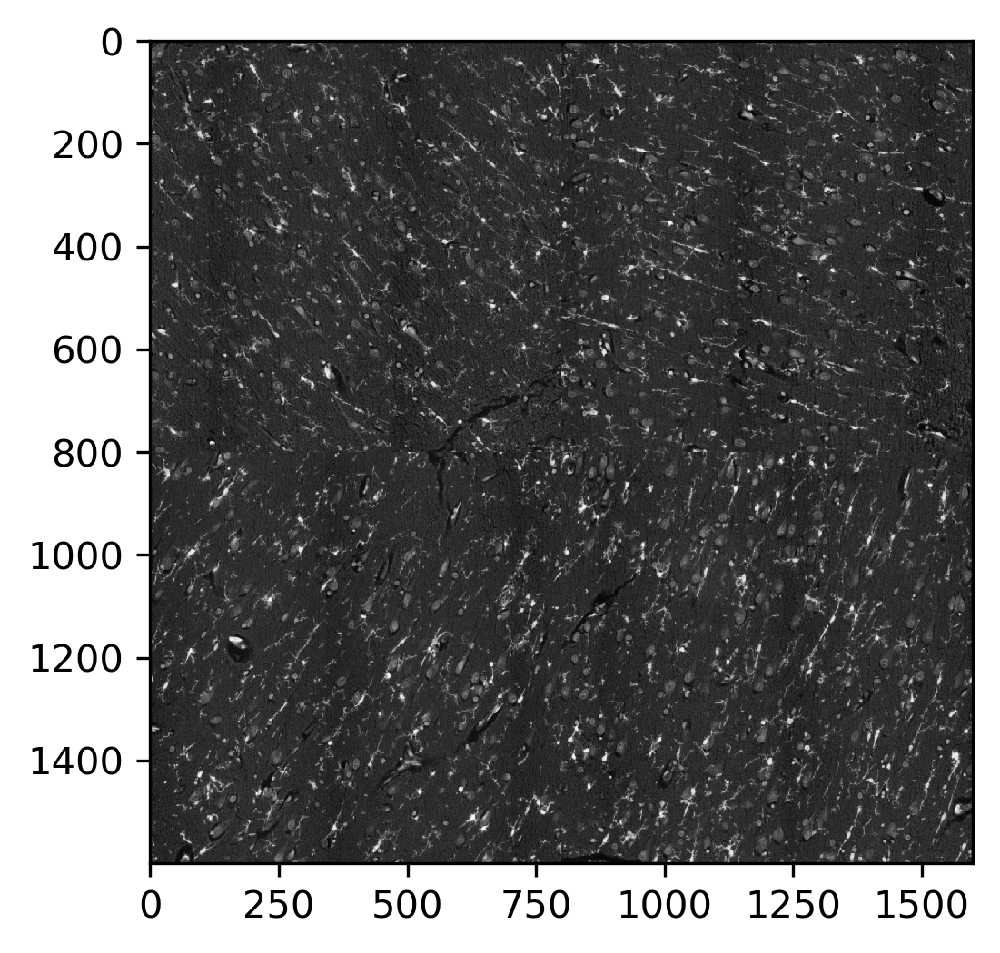

In [8]:
plt.figure(dpi=300)
plt.imshow(testImage,cmap='gray')

In [9]:
hits = ndimage.convolve(testImage,rod_filter)

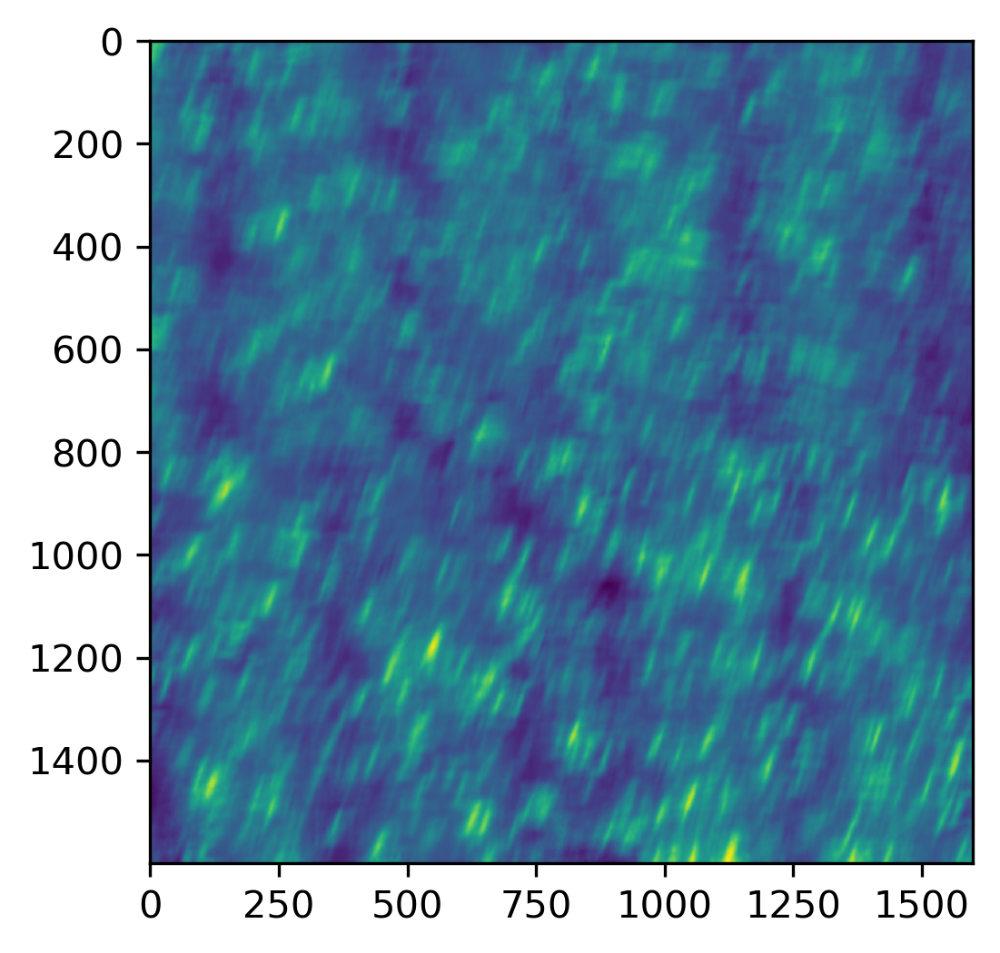

In [10]:
plt.figure(dpi=300)
plt.imshow(hits)

In [11]:
ROD_FILTER_SNR_THRES = 1.04

INNER_RADIUS = 20
OUTER_RADIUS = 25

In [12]:
SNR = mu.giveAnnulusSNR(hits,INNER_RADIUS,OUTER_RADIUS,thresh=ROD_FILTER_SNR_THRES,verbose=False)

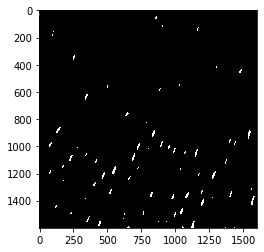

In [13]:
plt.imshow(SNR[1],cmap='gray')

In [14]:
# now we try to rotate the rod filter 
angles = [-90,-70,-50,-30,-10, 0, 10,30,50,70,90] # angles for rotated rod filters

all_response = []
all_SNR = []
all_TP = [] # all true positive score
all_detected_cells = [] 
for i in angles:
    rotated_rod = imutils.rotate(rod_filter,i)
    hits = ndimage.convolve(testImage,rotated_rod)
    SNR = mu.giveAnnulusSNR(hits,INNER_RADIUS,OUTER_RADIUS,thresh=ROD_FILTER_SNR_THRES,verbose=False)
    all_SNR.append(SNR)
    detected_cells, TP = mach_functions.calculate_TP(SNR[1],markimage,returnOverlap=True)
    all_detected_cells.append(detected_cells)
    all_TP.append(TP)
    

Found 92 cells in the annoated image
Successfully detected 13 cells
The True Positive (TP) score is  0.14
Found 92 cells in the annoated image
Successfully detected 20 cells
The True Positive (TP) score is  0.22
Found 92 cells in the annoated image
Successfully detected 22 cells
The True Positive (TP) score is  0.24
Found 92 cells in the annoated image
Successfully detected 23 cells
The True Positive (TP) score is  0.25
Found 92 cells in the annoated image
Successfully detected 28 cells
The True Positive (TP) score is  0.30
Found 92 cells in the annoated image
Successfully detected 25 cells
The True Positive (TP) score is  0.27
Found 92 cells in the annoated image
Successfully detected 28 cells
The True Positive (TP) score is  0.30
Found 92 cells in the annoated image
Successfully detected 24 cells
The True Positive (TP) score is  0.26
Found 92 cells in the annoated image
Successfully detected 18 cells
The True Positive (TP) score is  0.20
Found 92 cells in the annoated image
Successfu

In [15]:
for i, j in enumerate(all_TP):
    print ("Angle %s has %5.2f%% cells detected" % (angles[i],j*100))

Angle -90 has 14.13% cells detected
Angle -70 has 21.74% cells detected
Angle -50 has 23.91% cells detected
Angle -30 has 25.00% cells detected
Angle -10 has 30.43% cells detected
Angle 0 has 27.17% cells detected
Angle 10 has 30.43% cells detected
Angle 30 has 26.09% cells detected
Angle 50 has 19.57% cells detected
Angle 70 has 23.91% cells detected
Angle 90 has 14.13% cells detected


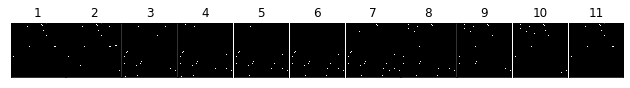

In [16]:
mach_functions.displayMultImage(all_detected_cells)

In [19]:
# if we use the reponse for each angle collectivly
total = np.zeros((markimage.shape))

for i in all_detected_cells:
    total = np.logical_or(i,total)

The total success rate is 65.22%


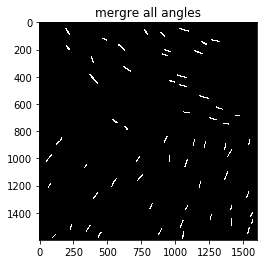

In [20]:
plt.imshow(total,cmap='gray')
plt.title('mergre all angles')
dummy, nums = measurements.label(total)
print (" The total success rate is %5.2f%%" %(nums*100/92))

In [21]:
colored = mach_functions.pasteImage(trueImage,total,"green")

([], <a list of 0 Text yticklabel objects>)

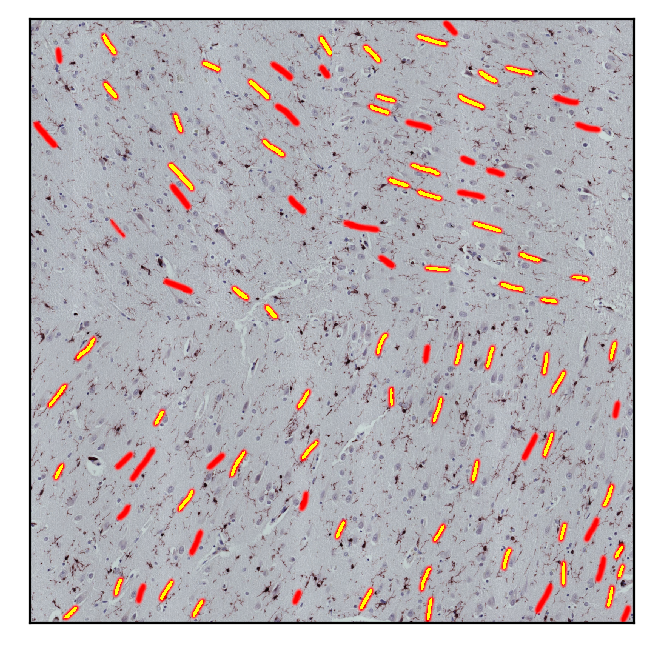

In [22]:
plt.figure(dpi=200)
plt.imshow(colored)
plt.xticks([])
plt.yticks([])

### the following is try to generate the rod filter using new strategy: 1) algin rod cells vertically 2) generate subimages 3) use the subimages to construct the MACH filter

In [23]:
cropped_rod_cells_directory = "./cropped_cells/"

original_image = []
aligned_image = []
subimages = dict()

for i in [a for a in os.listdir(cropped_rod_cells_directory) if a[:3] == "rod"]:
    print (i)    
#for i in ["rod_1.tif"]:

    image = util.ReadImg(cropped_rod_cells_directory+i).astype(np.uint8)
    image = mach_functions.PreProcessCroppedCells(image) # converts to gray-scale, inverse black/white and normolize
    original_image.append(image)
    
    rotated_image = mach_functions.alignRodCellvertically(image,ImageName=i,thres=0.6) # align all rod images vertically 
    aligned_image.append(rotated_image)

    sub_images = mach_functions.GenerateSubImage(rotated_image)
    subimages[i] = sub_images
    

    

    





rod_5.tif
rod_9.tif
rod_10.tif
rod_7.tif
rod_1.tif
rod_3.tif
rod_8.tif
rod_6.tif
rod_2.tif


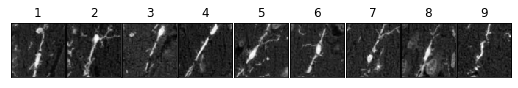

In [24]:
mach_functions.displayMultImage(original_image)

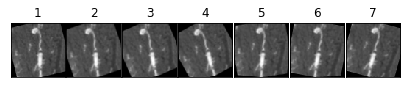

In [25]:
mach_functions.displayMultImage(subimages['rod_5.tif'])

In [27]:
# construct the MACH filter using the subimages

def RodMachFilter(subimages,
                    alpha,
                    beta,
                    gamma):
    """
    Construct the rod MACH filter using the subimages
    Note, subimages is a directory, i.e., subimages['rod_5.tif'] = [xxxx]
    """
    all_images = []
    for i in subimages.keys():
        all_images += subimages[i]

    imagelist = np.moveaxis(np.dstack(all_images),source=2,destination=0).astype(float)

    MACH_filter = rod_filter = mach.MACH2(
    imagelist,
    alpha = alpha,
    beta =  beta,
    gamma = gamma,
    displayFilter=False
    )
    MACH_filter /= np.sum(MACH_filter)
    return MACH_filter


    



In [28]:
import mach
rod_filter = RodMachFilter(subimages,alpha=10,beta=1e-4,gamma=1e-4)

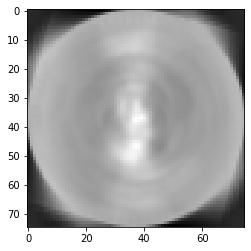

In [29]:
plt.imshow(rod_filter,cmap='gray')
# TODO need to adjust the alpha/beta/gamma values to make the filter looks like  a rod

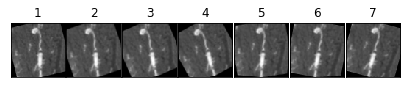

In [36]:
mach_functions.displayMultImage(subimages['rod_5.tif'])